## 이미지 전처리
- 객체인식 기계를 위한 전처리
  + opencv, C#, C++
- 딥러닝 알고리즘 모델링 학습을 위한 전처리
  + 텐서플로 & Pytorch
  + 각 딥러닝 메인 프레임워크
  + 모형 성능 이미지 데이터를 생성 / 변환 모듈 이미 다 만들어져 있음

- 강의용에 적합한 라이브러리 Scikit-Image

- 영역제안
-  Region Proposal


## Scikit-Image
- 홈페이지 : https://scikit-image.org/

## 구글 드라이브 연결 

In [1]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


## 필수 라이브러리 불러오기 

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import skimage
import matplotlib

print(np.__version__)
print(skimage.__version__)
print(matplotlib.__version__)

1.21.6
0.18.3
3.2.2


- 이미지 출력함수 만들기

In [3]:
def show_image(image, cmap_type='gray'):
  plt.imshow(image, cmap=cmap_type)
  plt.axis('off')
  plt.show()

def two_img(new_img, new_title, ori_img):
  fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize=(16, 10))
  ax[0].imshow(new_img, cmap='gray')
  ax[0].set_title(new_title)
  ax[1].imshow(ori_img, cmap='gray')
  ax[1].set_title("Original Image")
  plt.tight_layout()
  plt.show()

## 데이터 불러오기

In [4]:
from skimage import data
coffee_image = data.coffee()

print(coffee_image.shape)

(400, 600, 3)


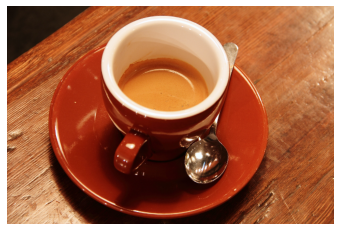

In [5]:
plt.imshow(coffee_image)
plt.axis('off')
plt.show()

## 색상 변경
- RGB를 grayscale로 변경 
- 3차원 데이터를 1차원으로 변경

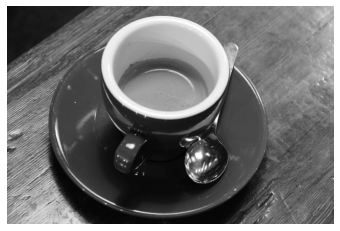

In [6]:
from skimage import color
gray_scaled_coffee = color.rgb2gray(coffee_image)
show_image(gray_scaled_coffee)

## NumPy 메서드 활용
- vertical flip : np.flipud()
  + URL : https://numpy.org/doc/stable/reference/generated/numpy.flipud.html 

- horizontal flip : np.fliplr()
  + URL : https://numpy.org/doc/stable/reference/generated/numpy.fliplr.html

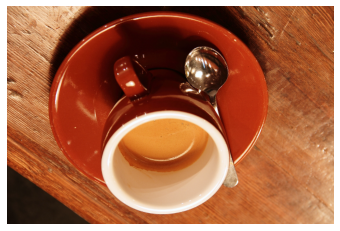

In [7]:
coffee_vertical_flip = np.flipud(coffee_image)
show_image(coffee_vertical_flip)

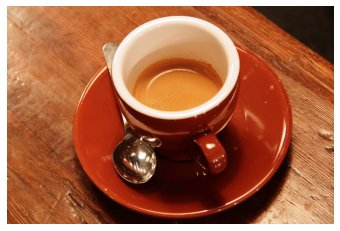

In [8]:
cofee_horizontal_flip = np.fliplr(coffee_image)
show_image(cofee_horizontal_flip)

## Color 시각화

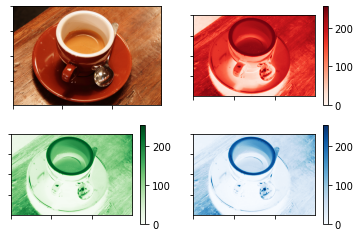

In [9]:
red_channel = coffee_image[:, :, 0]
green_channel = coffee_image[:, :, 1]
blue_channel = coffee_image[:, :, 2]

# Plot
fig, axs = plt.subplots(2,2)

cax_00 = axs[0,0].imshow(coffee_image)
axs[0,0].xaxis.set_major_formatter(plt.NullFormatter())  # kill xlabels
axs[0,0].yaxis.set_major_formatter(plt.NullFormatter())  # kill ylabels

cax_01 = axs[0,1].imshow(red_channel, cmap='Reds')
fig.colorbar(cax_01, ax=axs[0,1])
axs[0,1].xaxis.set_major_formatter(plt.NullFormatter())
axs[0,1].yaxis.set_major_formatter(plt.NullFormatter())

cax_10 = axs[1,0].imshow(green_channel, cmap='Greens')
fig.colorbar(cax_10, ax=axs[1,0])
axs[1,0].xaxis.set_major_formatter(plt.NullFormatter())
axs[1,0].yaxis.set_major_formatter(plt.NullFormatter())

cax_11 = axs[1,1].imshow(blue_channel, cmap='Blues')
fig.colorbar(cax_11, ax=axs[1,1])
axs[1,1].xaxis.set_major_formatter(plt.NullFormatter())
axs[1,1].yaxis.set_major_formatter(plt.NullFormatter())
plt.show()

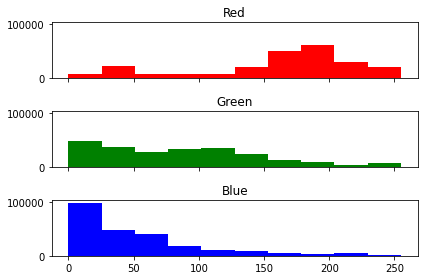

In [10]:
# Plot histograms
fig, axs = plt.subplots(3, sharex=True, sharey=True)

axs[0].hist(red_channel.ravel(), bins=10, color = "red")
axs[0].set_title('Red')
axs[1].hist(green_channel.ravel(), bins=10, color = "green")
axs[1].set_title('Green')
axs[2].hist(blue_channel.ravel(), bins=10, color = "blue")
axs[2].set_title('Blue')

plt.tight_layout()
plt.show()

## Thresholding
- 이미지를 foreground와 background 2개로 구분
- 흰색과 검은색 대비를 이룸 
- Image Segmentation의 기본적인 방법론 

- threshold_otsu() : 배경에서 객체를 분할하는 가장 간단한 방법. 
  + 참조 : https://en.wikipedia.org/wiki/Thresholding_%28image_processing%29
- 이미지를 흑백으로 만든다. 
  + 255 (흰색), if pixel > thresh value
  + 0  (검은색), if pixel < thresh value 
- 객체를 분리한다. 
  + Object Detection
  + Face Detection
- Thresholding Process
  + Original Image -- Grayscale Image -- Thresholded Image


- 처음 이미지

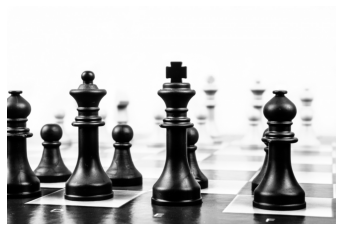

In [11]:
from skimage.filters import threshold_otsu

DATA_PATH = '/content/drive/MyDrive/Colab Notebooks/2022/Python 데이터 분석 라이브러리_20220423/Basic/Chapter 6. Image Preprocessing/data/'
chess_img = plt.imread(DATA_PATH + "bw.jpg")

show_image(chess_img)

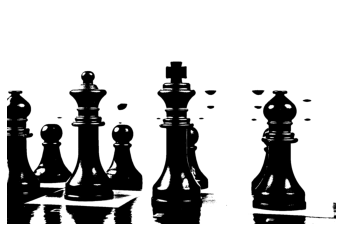

In [12]:
chess_img_gray = color.rgb2gray(chess_img)
thresh = threshold_otsu(chess_img_gray)
binary = chess_img_gray > thresh
show_image(binary)

## Background가 불명확할 때 
- 이미지 배경이 비교적 균일하면, threshold_otsu() 함수를 사용하면 됨
- 그런데 만약 불명확하다면 threshold_local()으로 임의 조장하여 더 나은 결과를 낳을 수 있음

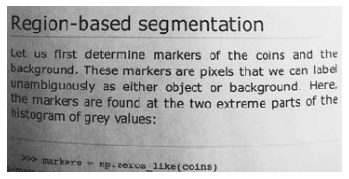

In [13]:
DATA_PATH = '/content/drive/MyDrive/Colab Notebooks/2022/Python 데이터 분석 라이브러리_20220423/Basic/Chapter 6. Image Preprocessing/data/'
page_img = plt.imread(DATA_PATH + "text_page.png")
show_image(page_img)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: Non RGB image conversion is now deprecated. For RGBA images, please use rgb2gray(rgba2rgb(rgb)) instead. In version 0.19, a ValueError will be raised if input image last dimension length is not 3.
  """Entry point for launching an IPython kernel.


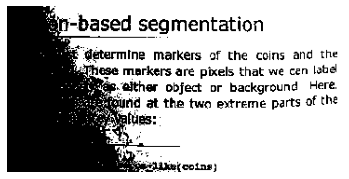

In [14]:
page_img = color.rgb2gray(page_img)
global_thresh = threshold_otsu(page_img)
binary_global = page_img > global_thresh
show_image(binary_global)

- 오히려 더 불명확하게 나타난다. 따라서 local 값을 적용한다. 

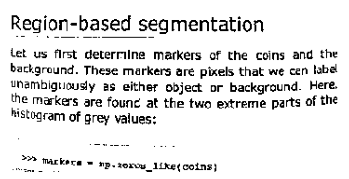

In [15]:
from skimage.filters import threshold_local

block_size = 35
local_thresh = threshold_local(page_img, block_size, offset=0.1)
binary_local = page_img > local_thresh
show_image(binary_local)

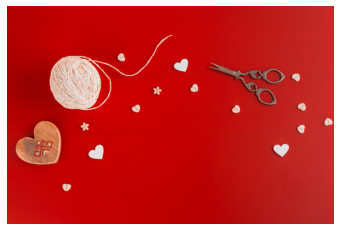

In [16]:
DATA_PATH = '/content/drive/MyDrive/Colab Notebooks/2022/Python 데이터 분석 라이브러리_20220423/Basic/Chapter 6. Image Preprocessing/data/'
tools_image = plt.imread(DATA_PATH + 'shapes52.jpg')

show_image(tools_image)

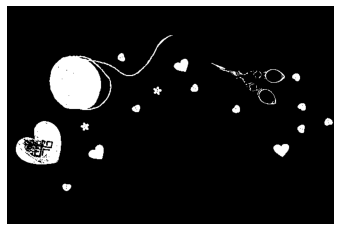

In [17]:
gray_tools_image = color.rgb2gray(tools_image)
thresh = threshold_otsu(gray_tools_image)
binary_image = gray_tools_image > thresh
show_image(binary_image)

## Image Transformation
- 

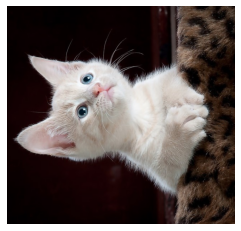

In [18]:
from skimage.transform import rotate, rescale

DATA_PATH = '/content/drive/MyDrive/Colab Notebooks/2022/Python 데이터 분석 라이브러리_20220423/Basic/Chapter 6. Image Preprocessing/data/'
cat_img = plt.imread(DATA_PATH + 'image_cat.jpg')

show_image(cat_img)

- 이미지 회전 시키기 

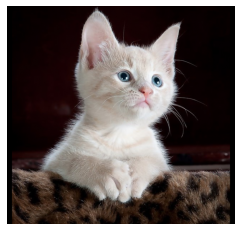

In [19]:
rotated_cat_img = rotate(cat_img, -90)
show_image(rotated_cat_img)

- Rescaling

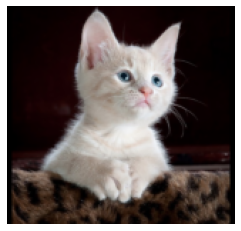

In [20]:
rescaled_with_aliasing = rescale(rotated_cat_img, 1/4, anti_aliasing=True, multichannel=True)
show_image(rescaled_with_aliasing)

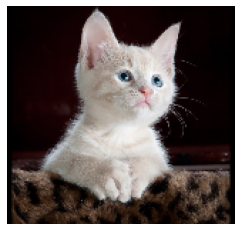

In [21]:
rescaled_no_aliasing = rescale(rotated_cat_img, 1/4, anti_aliasing=False, multichannel=True)
show_image(rescaled_no_aliasing)

- Size 확장

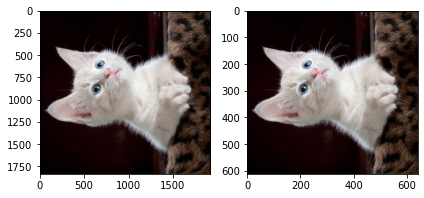

In [22]:
rescaled_sizeup = rescale(cat_img, 3, anti_aliasing=True, multichannel=True)

fig, ax = plt.subplots(nrows = 1, ncols = 2)
ax[0].imshow(rescaled_sizeup, cmap='gray')
ax[1].imshow(cat_img, cmap='gray')
plt.tight_layout()
plt.show()

### Edge Detection 

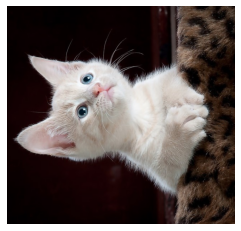

In [23]:
show_image(cat_img)

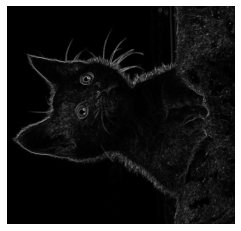

In [24]:
from skimage import color
from skimage.filters import sobel

cat_image_gray = color.rgb2gray(cat_img)
edge_sobel = sobel(cat_image_gray)
show_image(edge_sobel)

- Resizing 

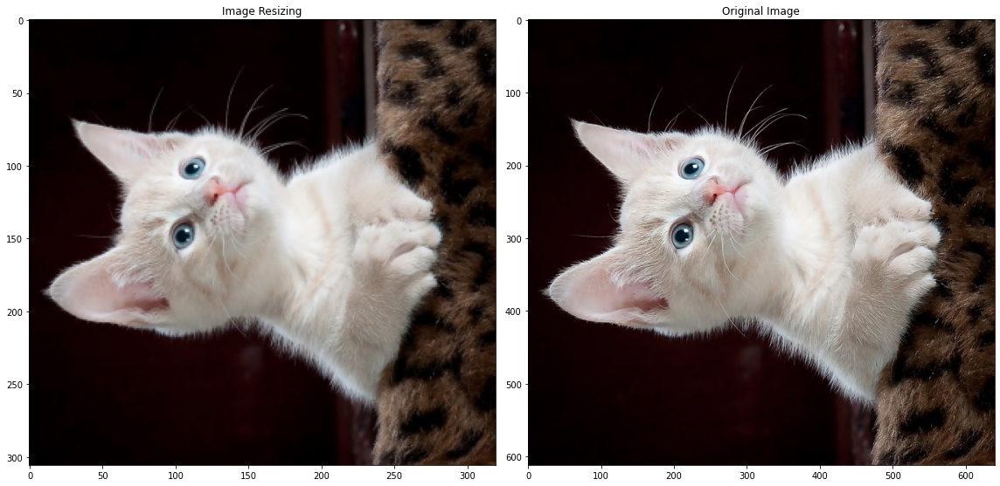

In [26]:
from skimage.transform import resize

height = int(cat_img.shape[0] / 2.0)
width = int(cat_img.shape[1] / 2.0)

image_resized = resize(cat_img, (height, width),
                       anti_aliasing=True)

two_img(image_resized, "Image Resizing", cat_img)

## Image Restoration 

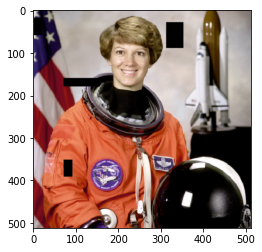

In [27]:
from skimage.restoration import inpaint 
from skimage import data
from skimage.transform import resize
defect_image = plt.imread(DATA_PATH + 'damaged_astronaut.png')
defect_image = resize(defect_image, (512, 512))
defect_image = color.rgba2rgb(defect_image)
plt.imshow(defect_image)
plt.show()

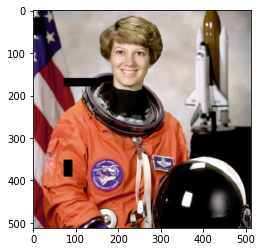

In [30]:
mask = np.zeros(defect_image.shape[:-1])
mask[20:90, 310:360] = 1
restored_image = inpaint.inpaint_biharmonic(defect_image, mask, multichannel=True)
plt.imshow(restored_image)
plt.show()

### Noise
- 참조 : https://scikit-image.org/docs/stable/auto_examples/filters/plot_denoise.html

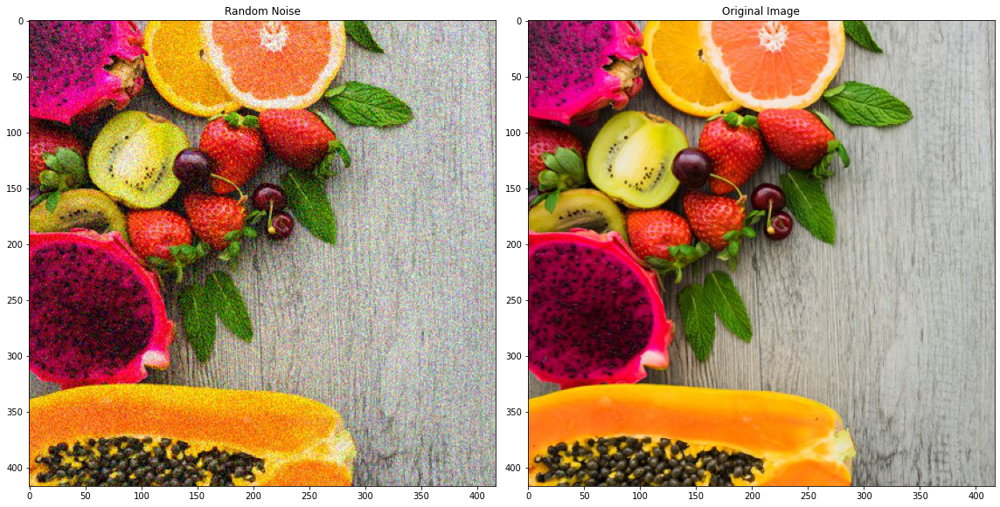

In [31]:
from skimage.util import random_noise
fruit_img = plt.imread(DATA_PATH + 'fruits_square.jpg')

# 랜덤 노이즈 생성
noisy_img = random_noise(fruit_img)

two_img(noisy_img, "Random Noise", fruit_img)

## 노이즈 축소

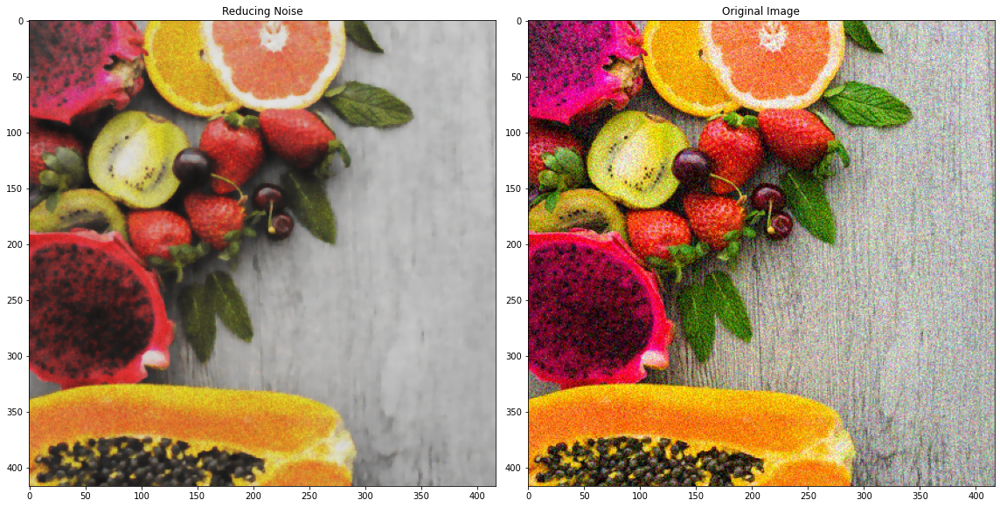

In [32]:
from skimage.restoration import denoise_tv_chambolle

# 랜덤 노이즈 제거
denoised_img = denoise_tv_chambolle(noisy_img)
two_img(denoised_img, "Reducing Noise", noisy_img)

- 

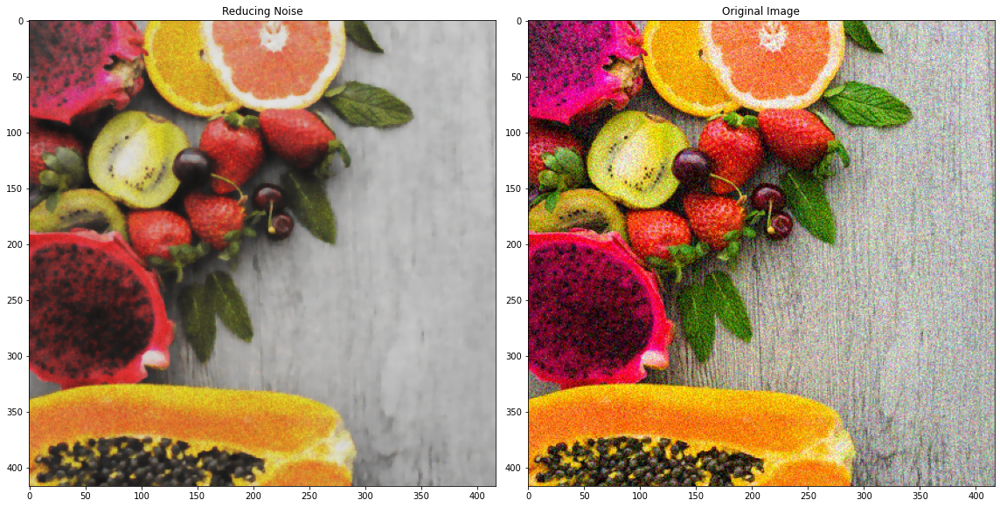

In [33]:
from skimage.restoration import denoise_bilateral

denoised_image = denoise_bilateral(noisy_img, multichannel=True)
two_img(denoised_img, "Reducing Noise", noisy_img)

## Superpixel Segmentation

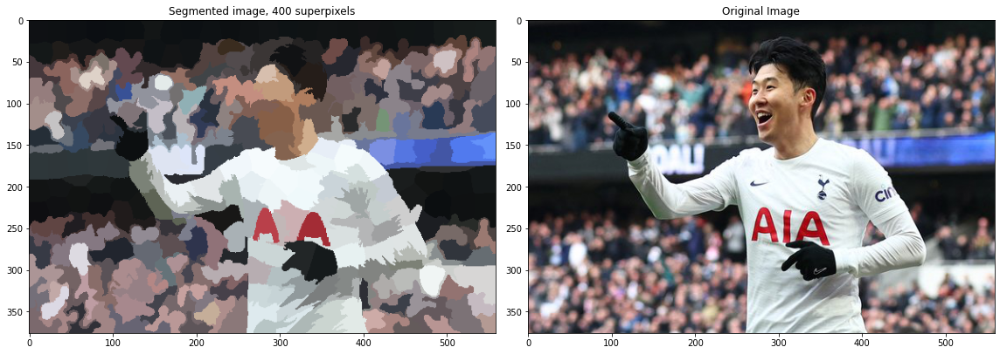

In [36]:
from skimage.segmentation import slic
from skimage.color import label2rgb
from skimage import img_as_float

son_img = plt.imread(DATA_PATH + 'son.jpg')

img = img_as_float(son_img)
segments = slic(img, n_segments= 400, start_label = 1)
segmented_image = label2rgb(segments, img, kind='avg', bg_label = 0)

two_img(segmented_image, "Segmented image, 400 superpixels", img)

## Edges
- Canny : https://scikit-image.org/docs/dev/auto_examples/edges/plot_canny.html

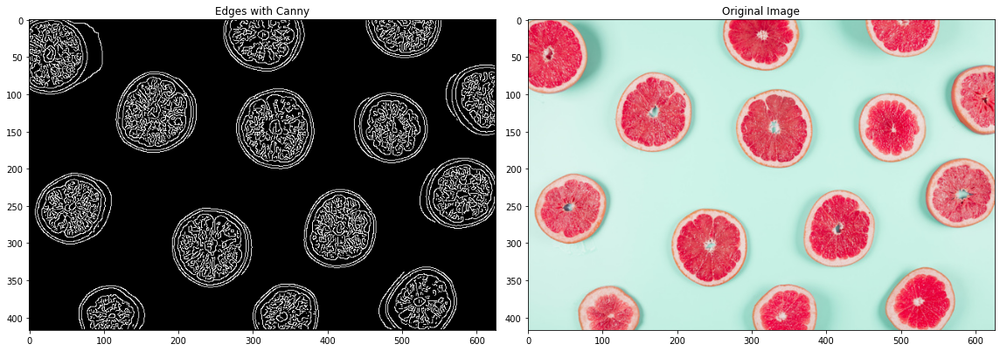

In [37]:
from skimage.feature import canny

grape_img = plt.imread(DATA_PATH + 'toronjas.jpg')
grape_img_gray = color.rgb2gray(grape_img)
canny_edges = canny(grape_img_gray)

two_img(canny_edges, "Edges with Canny", grape_img)

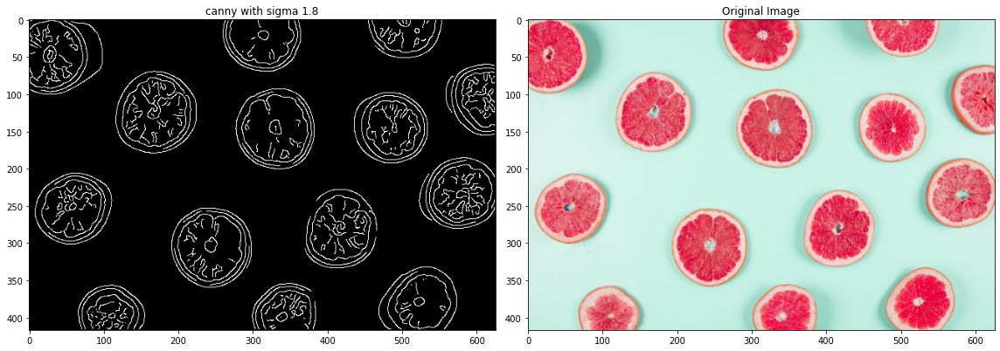

In [ ]:
edges_1_8 = canny(grape_img_gray, sigma=1.8)
two_img(edges_1_8, "canny with sigma 1.8", grape_img)

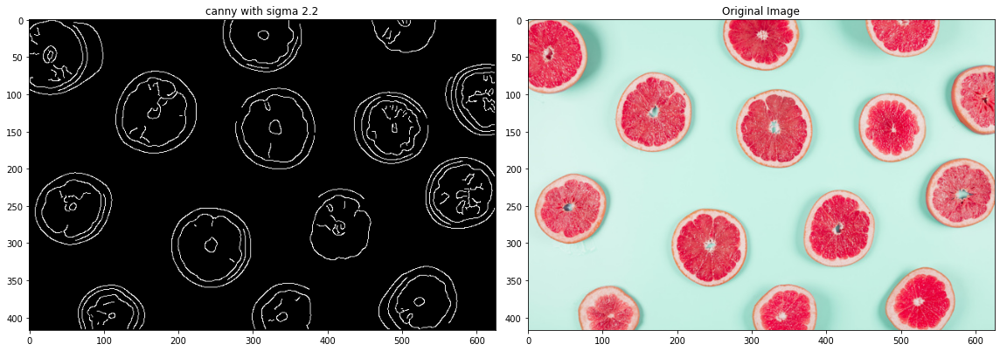

In [ ]:
edges_2_2 = canny(grape_img_gray, sigma=2.2)
two_img(edges_2_2, "canny with sigma 2.2", grape_img)

## Final Application

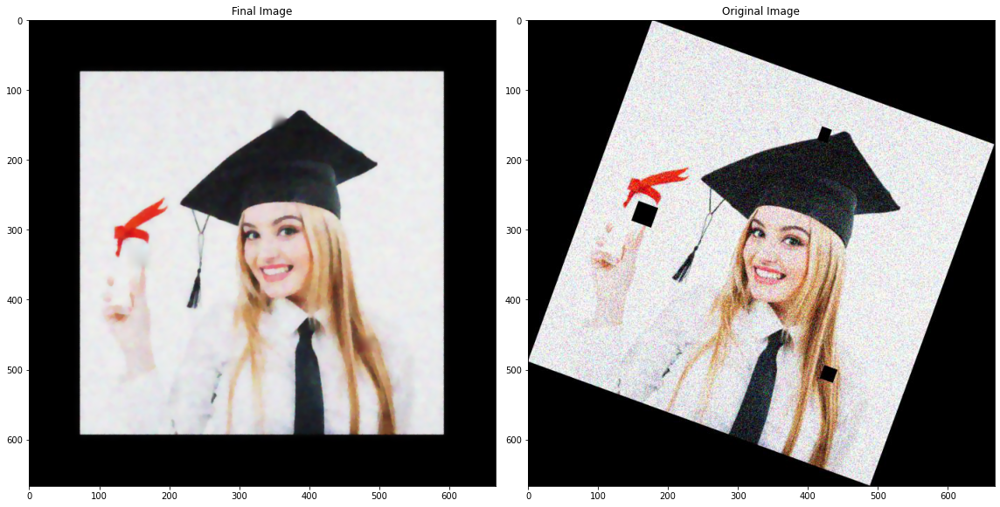

In [38]:
from skimage.restoration import denoise_tv_chambolle, inpaint
from skimage.transform import rotate

def get_mask(image):
    mask_for_solution = np.zeros(image.shape[:-1])
    mask_for_solution[450:475, 470:495] = 1
    mask_for_solution[320:355, 140:175] = 1
    mask_for_solution[130:155, 345:370] = 1
    return mask_for_solution

damaged_img = plt.imread(DATA_PATH + 'sally_damaged_image.jpg')
upright_img = rotate(damaged_img, 20)
upright_img_without_noise = denoise_tv_chambolle(upright_img,weight=0.1, multichannel=True)

mask = get_mask(upright_img)
result = inpaint.inpaint_biharmonic(upright_img_without_noise, mask, multichannel=True)

two_img(result, "Final Image", damaged_img)